In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
from numba import vectorize, complex128, int64
import os

@vectorize([int64(complex128, int64)], target='cpu')
def compute_mandelbrot(c, max_iters):
    """Compute the Mandelbrot set value for a given complex number."""
    z = 0.0 + 0.0j
    for i in range(max_iters):
        z = z**2 + c
        if z.real**2 + z.imag**2 > 4.0:
            return i
    return 0

def mandelplot(x, y, size, width, height, max_iters, cmap='viridis', dpi=450, save=True):
    """Plot the Mandelbrot set for the given range of the complex plane."""
    
    # Calculate the xmin, xmax, ymin, and ymax values, 
    # which determines the region tot be plotted on the graph
    xmin = x - size / 2
    xmax = x + size / 2
    ymin = y - size / 2
    ymax = y + size / 2
    
    def calc_figsize(width, height, dpi=dpi):
        """Calculate the figsize values for a given width and height to be passed to matplotlib"""
        figsize = (width / float(dpi), height / float(dpi))
        return figsize

    # Set up the grid of complex numbers to iterate over
    xx, yy = np.meshgrid(np.linspace(xmin, xmax, width), np.linspace(ymin, ymax, height))
    c = xx + 1j * yy
    
    # Compute the Mandelbrot set for each point in the grid
    mandelbrot_set = compute_mandelbrot(c, max_iters)
    mandelbrot_set = mandelbrot_set.reshape(c.shape)
    
    # Plot the image
    fig, ax = plt.subplots(figsize=calc_figsize(width, height, dpi=dpi), dpi=dpi)
    ax.xaxis.set_major_locator(ticker.MaxNLocator(20))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(20))
    # Rotate x tick labels
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
    ax.imshow(mandelbrot_set.T, cmap=cmap, extent=[xmin, xmax, ymin, ymax])
    filename = f'x{x}_y{y}_size{size}_w{width}_h{height}_{cmap}.png'
    filepath = os.path.join('./fractal_images', filename)
    if save:
        plt.savefig(filepath)
    plt.show()

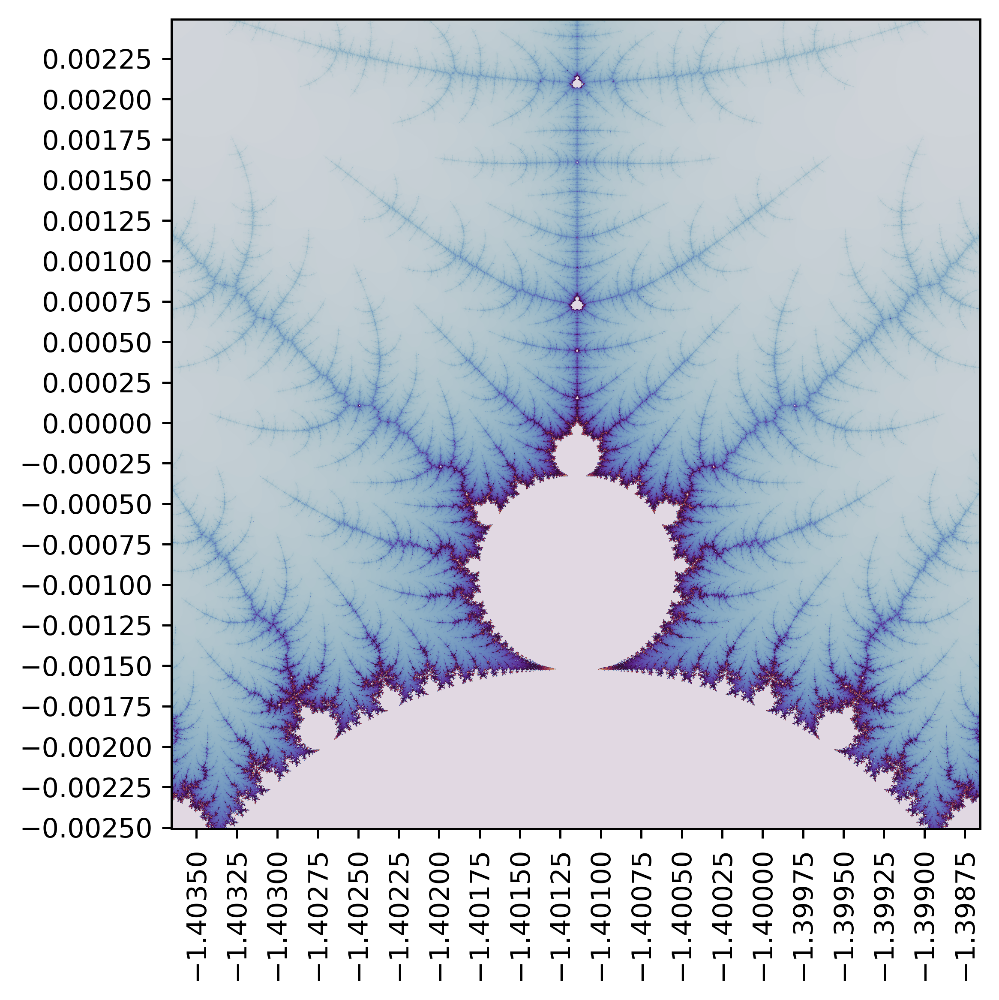

In [67]:
mandelplot(-1.401155189278760308537234835067594508, -0.000007034726233994307743107715161954, 0.005, 2500, 2500, 1000, cmap='twilight', save=False)

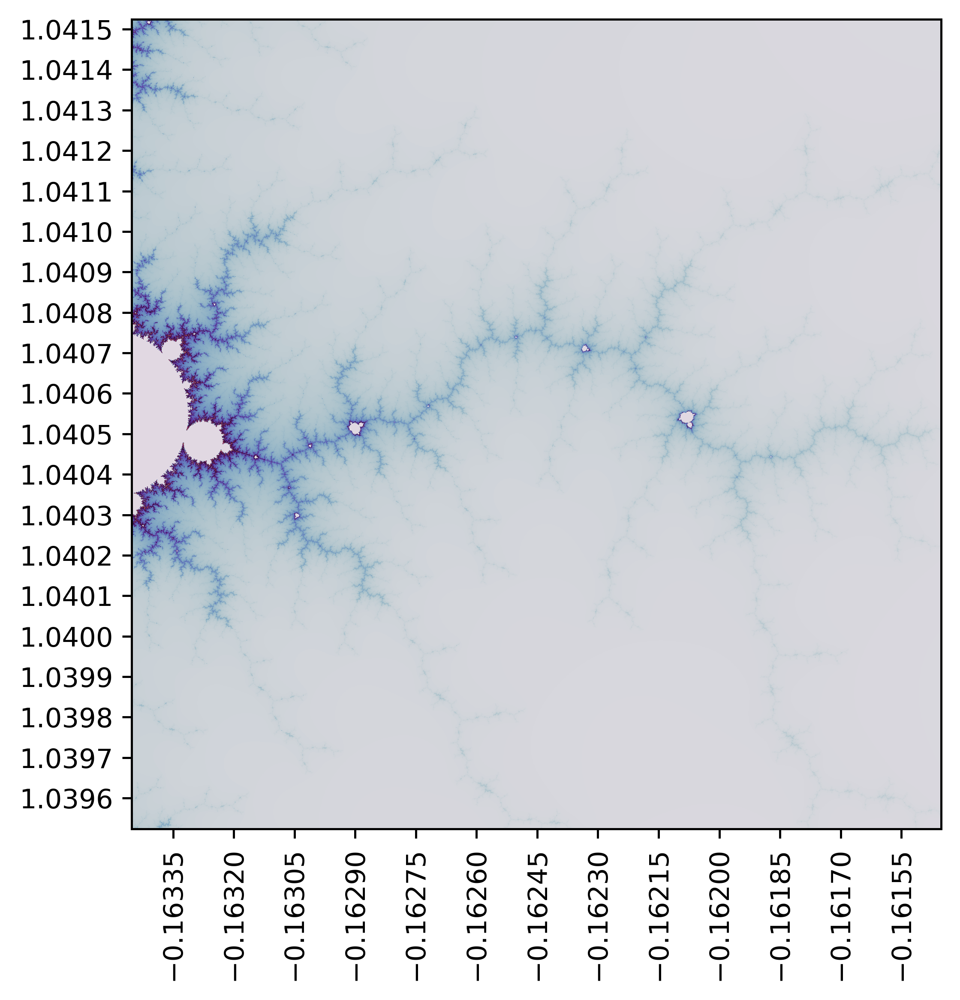

In [66]:
mandelplot(-0.162451870542194, 1.040524435805453, 0.002, 2500, 2500, 1000, cmap='twilight', save=False)

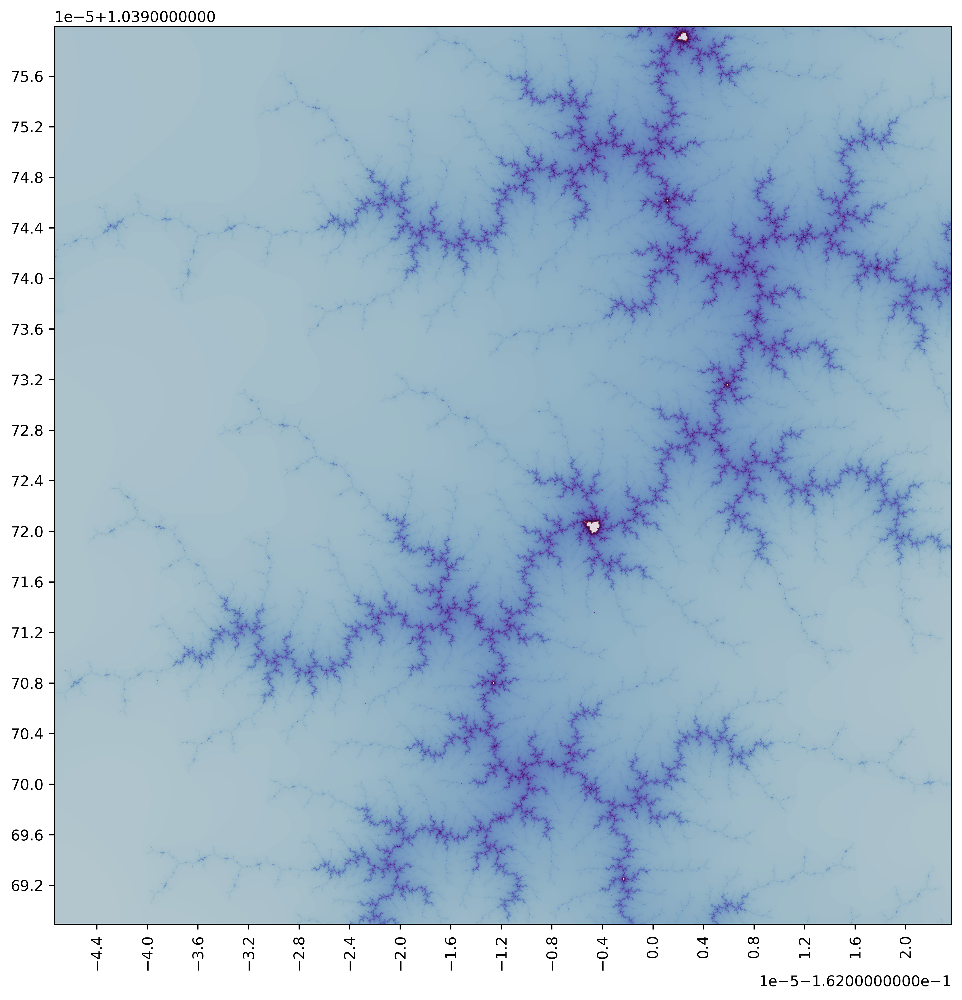

In [65]:
mandelplot(-0.162011870542194, 1.039724435805453, 0.000071, 5000, 5000, 740, cmap='twilight', save=False)